---
**Importing Libraries:**

* To get started we will use Python for data pre-processing and data analysis.
* Import python libraries as necessary to get started for data load and later import other libraries as needed

---

In [1]:
import numpy as np 
# data processing, CSV file I/O (e.g. pd.read_csv)
import pandas as pd 
# data processing, CSV file I/O (e.g. dd.read_csv)
import dask
import dask.dataframe as dd
# module finds all the pathnames matching a specified pattern
import glob 
import os
# Importing pyplot interface using matplotlib
import matplotlib.pyplot as plt 
# Importing seaborn library for interactive visualization
import matplotlib
# Importing datetime for using datetime
import plotly.express as px
# Importing missingno for missing value plot
import missingno as msno
# importing regex library for use of regex
import re
import seaborn as sns 
from imblearn.over_sampling import BorderlineSMOTE
import sklearn
from sklearn.model_selection import GridSearchCV,cross_validate
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.metrics import f1_score, make_scorer,confusion_matrix,precision_score,recall_score,roc_curve, auc
from sklearn.neighbors import KNeighborsClassifier

**Dataset Load/Data Display**

In [2]:
# Loading dataset train_data.csv
train_df = pd.read_csv('training.csv')

In [3]:
# get shape of training dataframe
print('Shape of training dataset is:', train_df.shape)
# print summary of dataframe
train_df.info()

Shape of training dataset is: (238836, 11)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 238836 entries, 0 to 238835
Data columns (total 11 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   event   238836 non-null  int64  
 1   var1    133036 non-null  float64
 2   var2    117036 non-null  float64
 3   var3    46637 non-null   float64
 4   var4    78187 non-null   float64
 5   var5    8287 non-null    float64
 6   var6    5939 non-null    float64
 7   var7    27542 non-null   float64
 8   var8    101147 non-null  float64
 9   split   238836 non-null  object 
 10  id      238836 non-null  int64  
dtypes: float64(8), int64(2), object(1)
memory usage: 20.0+ MB


**Observations:**

* There are total 11 variables in training.csv dataset
    * There are 8 variables(Columns) as dtype float64, 2 variable(Column) as dtype int64 and 1 variables(Columns) as dtype object

In [4]:
# print last 10 rows of dataframe
train_df.head(10)

,event,var1,var2,var3,var4,var5,var6,var7,var8,split,id
0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dev,0
1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dev,1
2,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dev,2
3,1,1.0,2.096510e+07,NaN,NaN,NaN,NaN,NaN,62.750000,dev,3
4,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dev,4
5,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dev,5
6,1,1.0,1.361692e+06,NaN,NaN,NaN,NaN,NaN,65.166667,dev,6
7,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dev,7
8,1,1.0,2.268649e+06,NaN,NaN,NaN,NaN,NaN,61.208333,dev,8
9,1,1.0,2.149415e+03,NaN,13.0,NaN,NaN,NaN,NaN,dev,9


In [5]:
# print last 10 rows of dataframe
train_df.tail(10)

,event,var1,var2,var3,var4,var5,var6,var7,var8,split,id
238826,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dev,238826
238827,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dev,238827
238828,1,1.0,6145.813666,9.292112,13.0,NaN,NaN,NaN,NaN,dev,238828
238829,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dev,238829
238830,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dev,238830
238831,1,1.0,65231.184334,NaN,NaN,NaN,NaN,NaN,58.916667,dev,238831
238832,1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dev,238832
238833,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dev,238833
238834,1,1.0,888032.509834,3.213000,13.0,NaN,NaN,NaN,63.958333,dev,238834
238835,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,dev,238835


**Observations:**

* Event variable may be the target
* var1 to var8 have missing value

In [6]:
# distribution count of event variable
train_df['event'].value_counts()

1    232804
0      6032
Name: event, dtype: int64

In [7]:
# plot percentage of distribution count for target variable
fig = px.pie(train_df, names='event')
fig.show()

**Observation:**

* Sample dataset has event=1 around 97.5% and event=0 around 2.5% (data imbalance exist).

In [8]:
# Lets extract columns names for easy access
Var_columns = [col for col in train_df.columns if 'var' in col]
print ("Total number of columns starting with var is", len(Var_columns))
print (Var_columns)
display(train_df[Var_columns].info(verbose=True))

Total number of columns starting with var is 8
['var1', 'var2', 'var3', 'var4', 'var5', 'var6', 'var7', 'var8']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 238836 entries, 0 to 238835
Data columns (total 8 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   var1    133036 non-null  float64
 1   var2    117036 non-null  float64
 2   var3    46637 non-null   float64
 3   var4    78187 non-null   float64
 4   var5    8287 non-null    float64
 5   var6    5939 non-null    float64
 6   var7    27542 non-null   float64
 7   var8    101147 non-null  float64
dtypes: float64(8)
memory usage: 14.6 MB


None

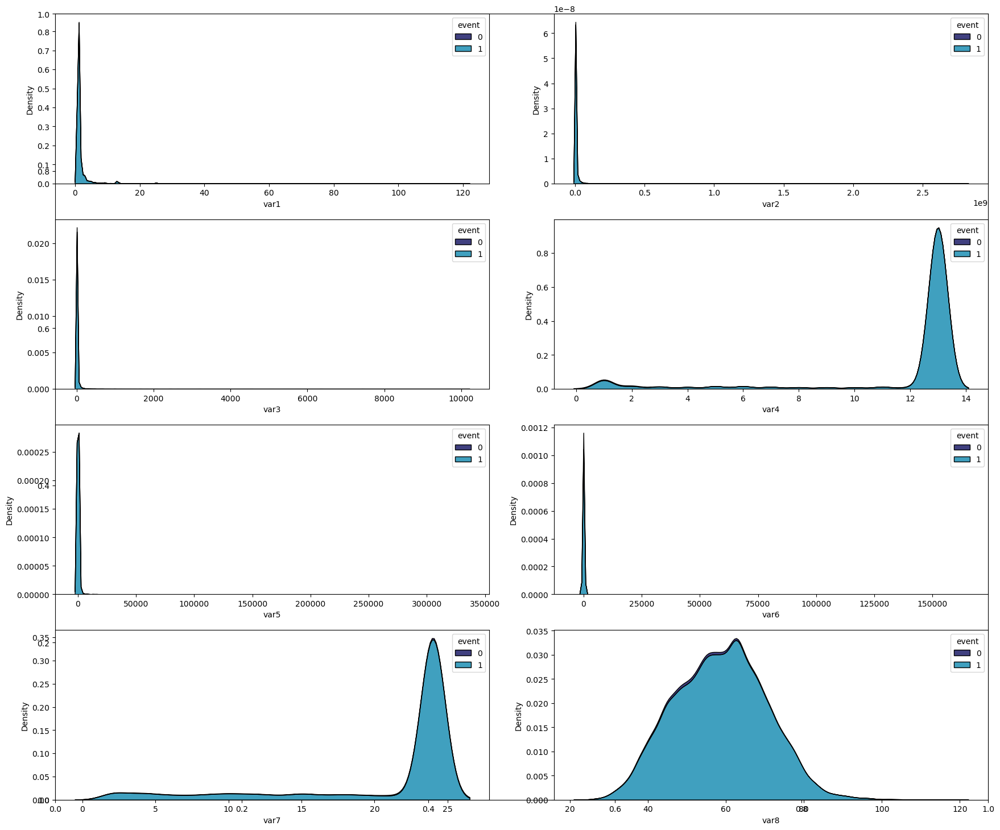

In [9]:
nrows = 4
ncols = 2
fig, axes = plt.subplots(figsize=(18,15)) 
for i, col in enumerate(Var_columns):
    ax=fig.add_subplot(nrows, ncols, i+1)
    sns.kdeplot(x=train_df[col], hue=train_df['event'], multiple="stack",palette="ocean",ax=ax)
    
fig.tight_layout()  
plt.show()

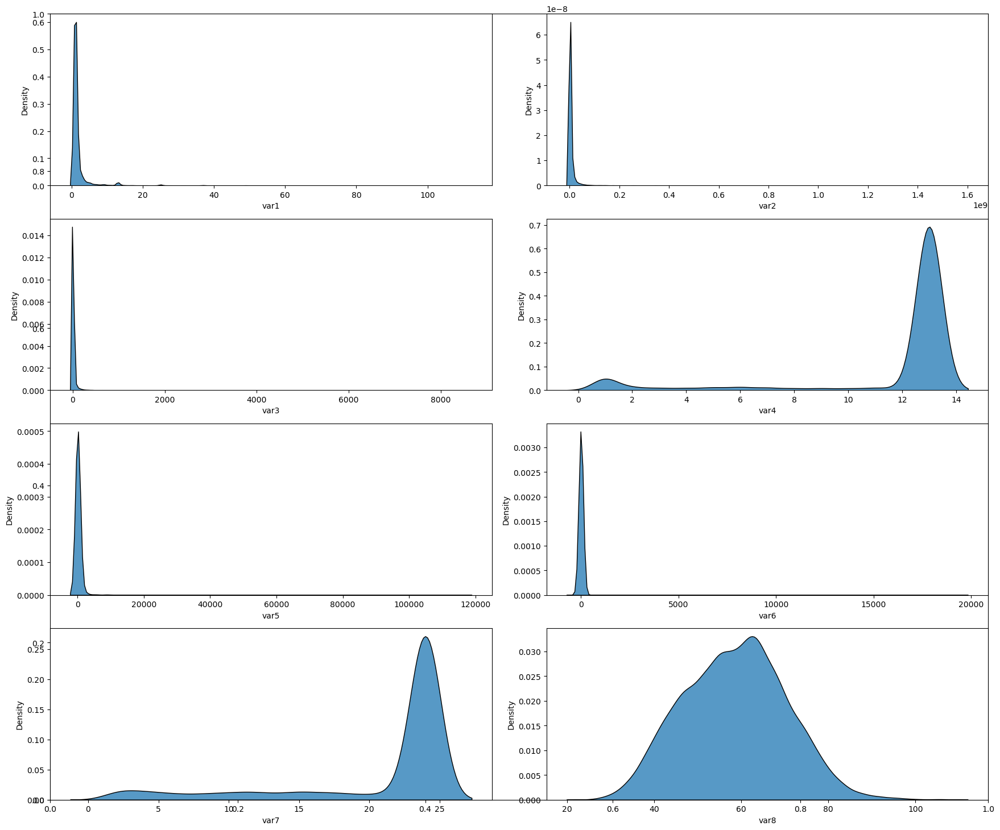

In [70]:
test_df = pd.read_csv('test.csv')
nrows = 4
ncols = 2
fig, axes = plt.subplots(figsize=(18,15)) 
for i, col in enumerate(Var_columns):
    ax=fig.add_subplot(nrows, ncols, i+1)
    sns.kdeplot(x=test_df[col], multiple="stack",palette="ocean",ax=ax)
    
fig.tight_layout()  
plt.show()

**Observation:**

* Var8 is approximately normally distributed, while the other variables are skewed.
* There is no obvious relationship between the distribution of features and labels.
* Test dataset has the same distribution as training dataset

<AxesSubplot:>

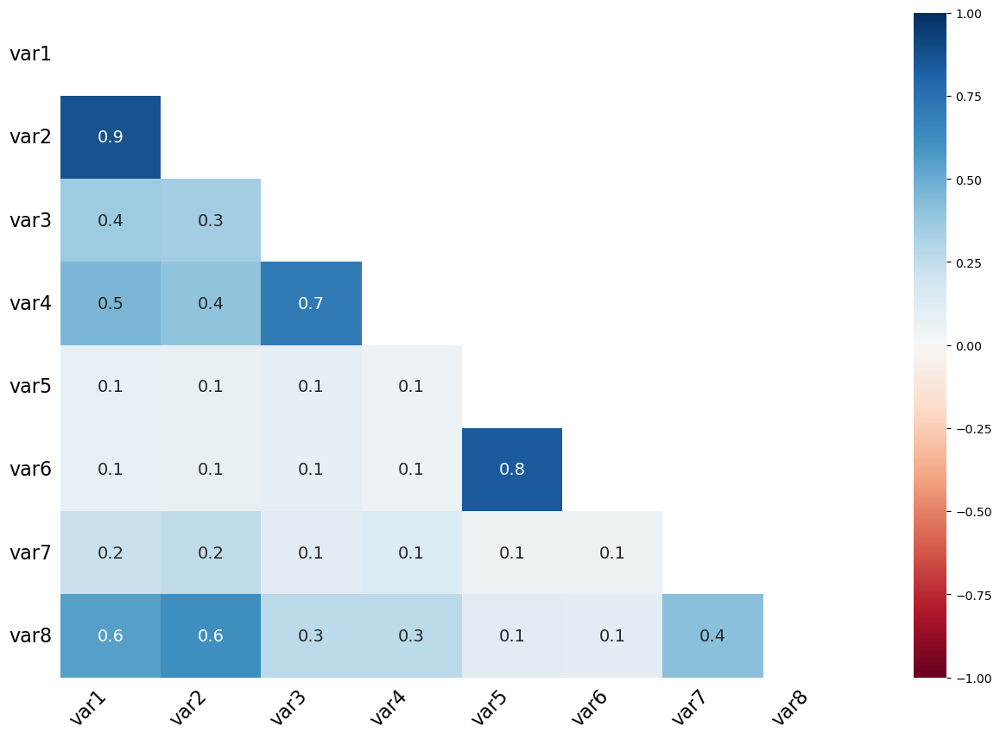

In [10]:
msno.heatmap(train_df[Var_columns],figsize=(15,10))

**Observation:**

* Var2 is highly correlated with Var1.
* Var4 is highly correlated with Var3.
* Var5 is highly correlated with Var6.

---
**Check the missin rate and missing value plot for var1~var8**

---

In [11]:
def miss_col(data):
    col_total = data.isnull().sum().sort_values(ascending=False)
    col_percent =(data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)
    return col_total, col_percent

var6    232897
var5    230549
var7    211294
var3    192199
var4    160649
var8    137689
var2    121800
var1    105800
dtype: int64
var6    0.975134
var5    0.965303
var7    0.884682
var3    0.804732
var4    0.672633
var8    0.576500
var2    0.509973
var1    0.442982
dtype: float64


<AxesSubplot:>

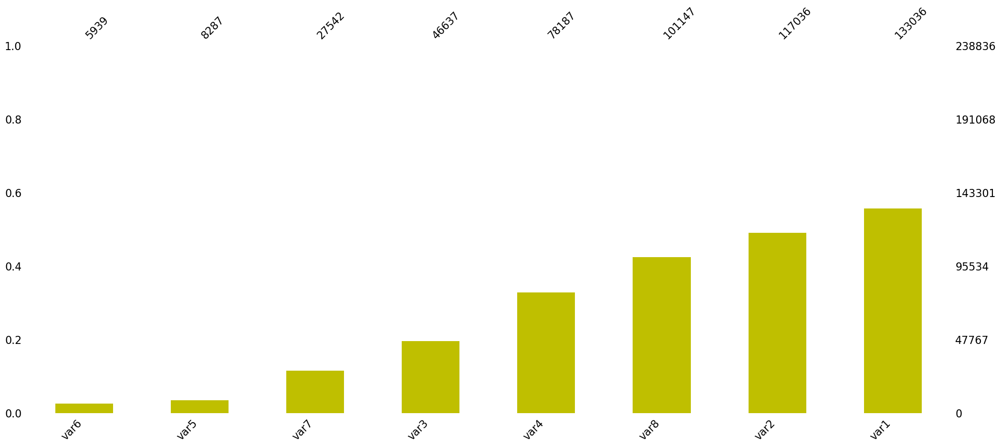

In [12]:
miss_cnum, miss_cper = miss_col(train_df[Var_columns])
print(miss_cnum)
print(miss_cper)
#plot of missing values
msno.bar(train_df[Var_columns],figsize=(25,10),sort="ascending", color="y")

var6    226913
var5    224569
var7    206008
var3    187212
var4    156587
var8    133358
var2    118261
var1    103005
dtype: int64
var6    0.974695
var5    0.964627
var7    0.884899
var3    0.804161
var4    0.672613
var8    0.572834
var2    0.507985
var1    0.442454
dtype: float64


<AxesSubplot:>

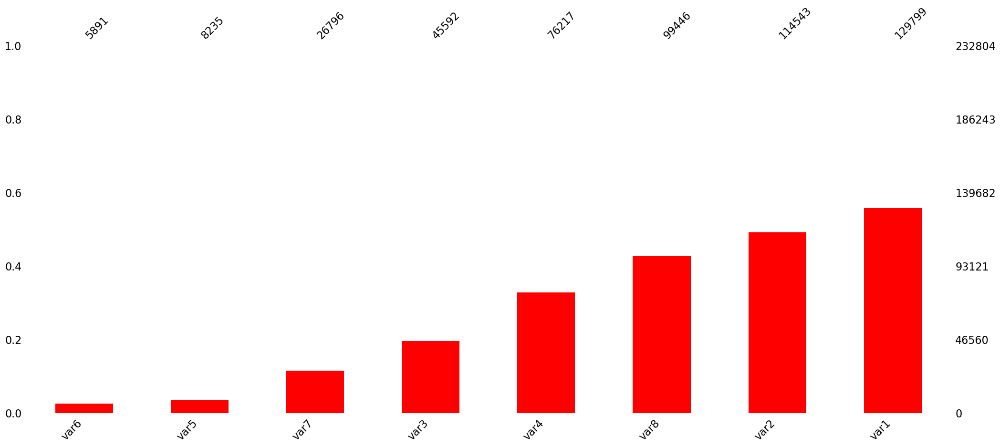

In [13]:
train_df_1 = train_df[train_df['event']==1]
miss_cnum_1, miss_cper_1 = miss_col(train_df_1[Var_columns])
print(miss_cnum_1)
print(miss_cper_1)
#plot of missing values
msno.bar(train_df_1[Var_columns],figsize=(25,10),sort="ascending", color="red")

var6    5984
var5    5980
var7    5286
var3    4987
var8    4331
var4    4062
var2    3539
var1    2795
dtype: int64
var6    0.992042
var5    0.991379
var7    0.876326
var3    0.826757
var8    0.718004
var4    0.673408
var2    0.586704
var1    0.463362
dtype: float64


<AxesSubplot:>

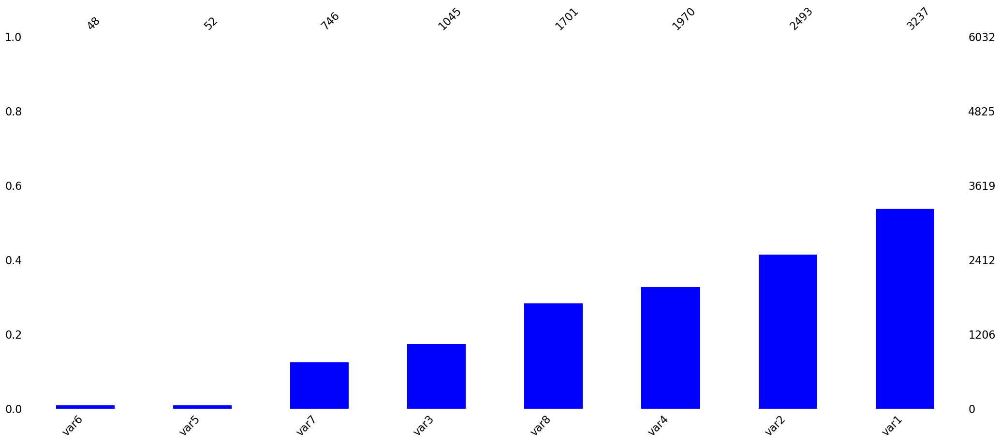

In [14]:
train_df_0 = train_df[train_df['event']==0]
miss_cnum_0, miss_cper_0 = miss_col(train_df_0[Var_columns])
print(miss_cnum_0)
print(miss_cper_0)
#plot of missing values
msno.bar(train_df_0[Var_columns],figsize=(25,10),sort="ascending", color="blue")

**Observation:**

* Var6 has the highest missing rate, var1 has the lowest missing rate
* All missing rates are higher than 40%
* There is no obvious relationship between the missing rate and labels.

**Delete samples missing all features and check the missing rate**

In [15]:
train_df = train_df.dropna(thresh=4)
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 154031 entries, 3 to 238834
Data columns (total 11 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   event   154031 non-null  int64  
 1   var1    133036 non-null  float64
 2   var2    117036 non-null  float64
 3   var3    46637 non-null   float64
 4   var4    78187 non-null   float64
 5   var5    8287 non-null    float64
 6   var6    5939 non-null    float64
 7   var7    27542 non-null   float64
 8   var8    101147 non-null  float64
 9   split   154031 non-null  object 
 10  id      154031 non-null  int64  
dtypes: float64(8), int64(2), object(1)
memory usage: 14.1+ MB


var6    148092
var5    145744
var7    126489
var3    107394
var4     75844
var8     52884
var2     36995
var1     20995
dtype: int64
var6    0.961443
var5    0.946199
var7    0.821192
var3    0.697223
var4    0.492394
var8    0.343333
var2    0.240179
var1    0.136304
dtype: float64


<AxesSubplot:>

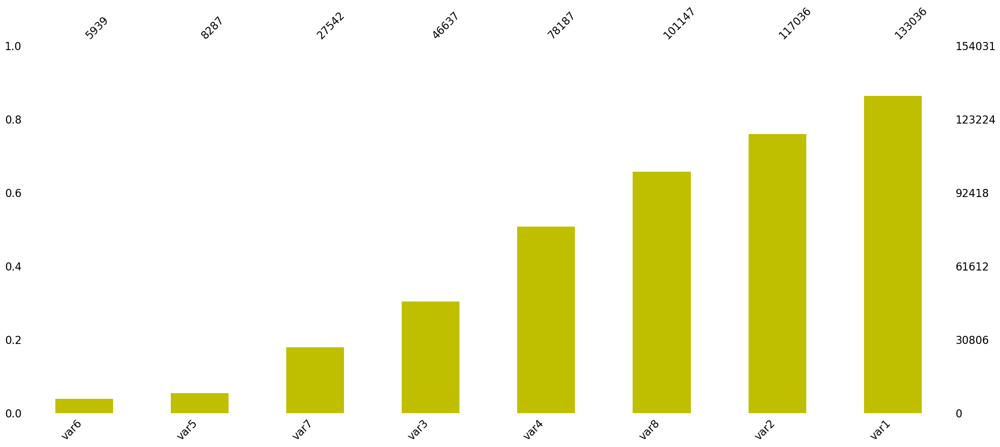

In [16]:
miss_cnum, miss_cper = miss_col(train_df[Var_columns])
print(miss_cnum)
print(miss_cper)
#plot of missing values
msno.bar(train_df[Var_columns],figsize=(25,10),sort="ascending", color="y")

var6    144648
var5    142304
var7    123743
var3    104947
var4     74322
var8     51093
var2     35996
var1     20740
dtype: int64
var6    0.960867
var5    0.945297
var7    0.822000
var3    0.697142
var4    0.493706
var8    0.339400
var2    0.239114
var1    0.137772
dtype: float64


<AxesSubplot:>

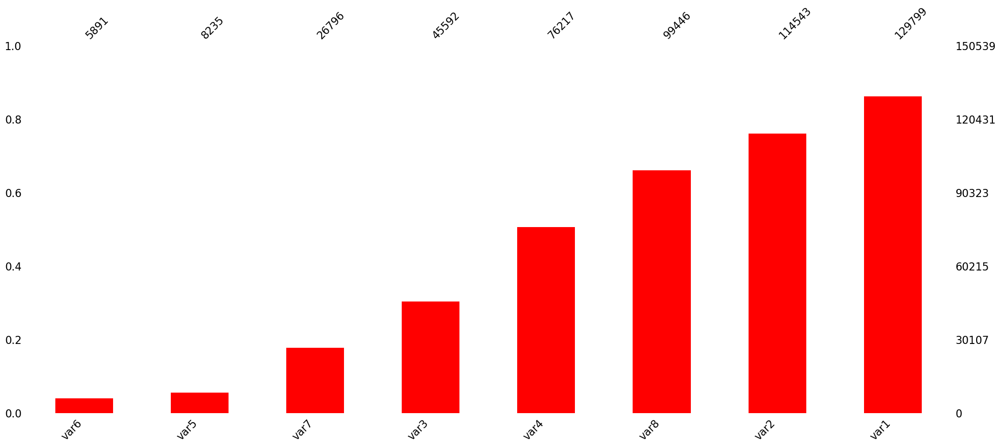

In [17]:
train_df_1 = train_df[train_df['event']==1]
miss_cnum_1, miss_cper_1 = miss_col(train_df_1[Var_columns])
print(miss_cnum_1)
print(miss_cper_1)
#plot of missing values
msno.bar(train_df_1[Var_columns],figsize=(25,10),sort="ascending", color="red")

var6    3444
var5    3440
var7    2746
var3    2447
var8    1791
var4    1522
var2     999
var1     255
dtype: int64
var6    0.986254
var5    0.985109
var7    0.786369
var3    0.700745
var8    0.512887
var4    0.435853
var2    0.286082
var1    0.073024
dtype: float64


<AxesSubplot:>

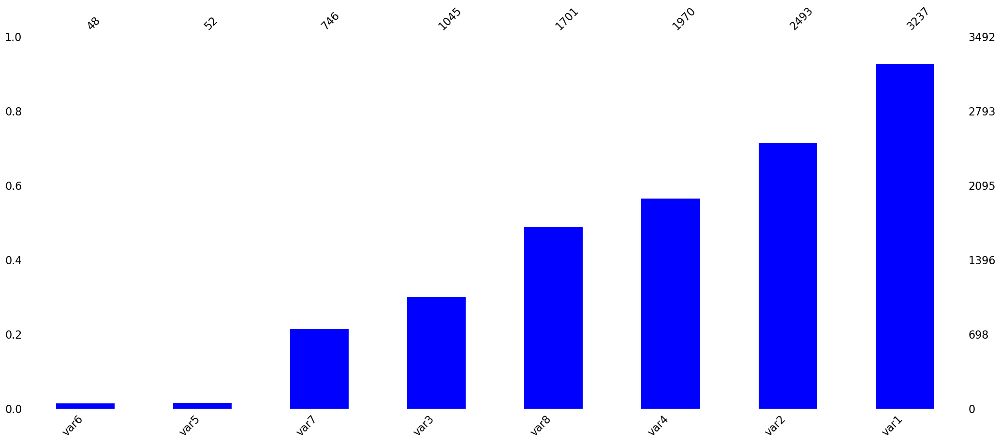

In [18]:
train_df_0 = train_df[train_df['event']==0]
miss_cnum_0, miss_cper_0 = miss_col(train_df_0[Var_columns])
print(miss_cnum_0)
print(miss_cper_0)
#plot of missing values
msno.bar(train_df_0[Var_columns],figsize=(25,10),sort="ascending", color="blue")

**Imputing the missing values:**

* Considering that the skewed distribution of features can greatly change the mean value, we fill the datasets with median value

In [19]:
train_filled = train_df[Var_columns].fillna(train_df[Var_columns].median())
train_filled.info
train_filled.head(10)

,var1,var2,var3,var4,var5,var6,var7,var8
3,1.0,2.096510e+07,1.509004,13.0,8.105200,0.296218,24.0,62.750000
6,1.0,1.361692e+06,1.509004,13.0,8.105200,0.296218,24.0,65.166667
8,1.0,2.268649e+06,1.509004,13.0,8.105200,0.296218,24.0,61.208333
9,1.0,2.149415e+03,1.509004,13.0,8.105200,0.296218,24.0,58.666667
10,1.0,8.042291e+05,1.509004,13.0,8.105200,0.296218,24.0,58.666667
11,2.0,7.522327e+06,1.163336,13.0,8.105200,0.296218,24.0,45.375000
12,1.0,5.661878e+05,0.646621,13.0,8.105200,0.296218,24.0,53.083333
13,1.0,4.655540e+05,1.509004,13.0,8.105200,0.296218,24.0,74.083333
14,13.0,8.810127e+03,1.509004,13.0,8.105200,0.296218,24.0,58.250000
15,1.0,1.194820e+06,1.509004,13.0,4.893348,0.016672,24.0,68.500000


In [20]:
train_filled.tail(10)

,var1,var2,var3,var4,var5,var6,var7,var8
238818,13.0,2.515334e+00,85.710398,13.0,8.105200,0.296218,10.0,55.750000
238819,1.0,1.684639e+04,2.728979,13.0,49.421429,0.296218,24.0,58.666667
238820,1.0,8.042291e+05,1.509004,13.0,8.105200,0.296218,24.0,58.666667
238821,1.0,2.401630e+06,2.188121,13.0,8.105200,0.296218,24.0,43.750000
238823,1.0,8.042291e+05,1.509004,13.0,210.209482,2.428439,24.0,78.666667
238825,1.0,7.391670e+02,0.513215,13.0,8.105200,0.296218,24.0,58.666667
238828,1.0,6.145814e+03,9.292112,13.0,8.105200,0.296218,24.0,58.666667
238831,1.0,6.523118e+04,1.509004,13.0,8.105200,0.296218,24.0,58.916667
238832,1.0,8.042291e+05,1.509004,13.0,8.105200,0.296218,24.0,58.666667
238834,1.0,8.880325e+05,3.213000,13.0,8.105200,0.296218,24.0,63.958333


In [21]:
# plot percentage of distribution count for target variable
fig = px.pie(train_df, names='event')
fig.show()

In [22]:
train_unbalanced = pd.concat([train_df['event'],train_filled],axis=1)
train_unbalanced.to_csv('train_unbalanced.csv',index=False)

**Dealing with class imbalance**

* We use smote algorithm to generate a new training dataset which is class-balanced

In [23]:
smote_data = BorderlineSMOTE().fit_resample(train_filled, train_df.iloc[:,0])
train_balanced = pd.DataFrame(smote_data[0])
target_balanced = pd.DataFrame(smote_data[1])
fig = px.pie(target_balanced,names='event')
fig.show()
train_processed = pd.concat([target_balanced,train_balanced],axis=1)
train_processed.head(10)

,event,var1,var2,var3,var4,var5,var6,var7,var8
0,1,1.0,2.096510e+07,1.509004,13.0,8.105200,0.296218,24.0,62.750000
1,1,1.0,1.361692e+06,1.509004,13.0,8.105200,0.296218,24.0,65.166667
2,1,1.0,2.268649e+06,1.509004,13.0,8.105200,0.296218,24.0,61.208333
3,1,1.0,2.149415e+03,1.509004,13.0,8.105200,0.296218,24.0,58.666667
4,1,1.0,8.042291e+05,1.509004,13.0,8.105200,0.296218,24.0,58.666667
5,1,2.0,7.522327e+06,1.163336,13.0,8.105200,0.296218,24.0,45.375000
6,1,1.0,5.661878e+05,0.646621,13.0,8.105200,0.296218,24.0,53.083333
7,1,1.0,4.655540e+05,1.509004,13.0,8.105200,0.296218,24.0,74.083333
8,1,13.0,8.810127e+03,1.509004,13.0,8.105200,0.296218,24.0,58.250000
9,1,1.0,1.194820e+06,1.509004,13.0,4.893348,0.016672,24.0,68.500000


In [24]:
train_processed.tail(10)

,event,var1,var2,var3,var4,var5,var6,var7,var8
301068,0,1.000000,804229.060555,1.509004,1.000000,8.1052,0.296218,24.0,58.666667
301069,0,1.000000,4596.622729,0.991161,5.118022,8.1052,0.296218,24.0,58.666667
301070,0,1.000000,804229.060555,1.509004,13.000000,8.1052,0.296218,24.0,58.666667
301071,0,1.000000,804229.060555,1.509004,13.000000,8.1052,0.296218,24.0,58.666667
301072,0,1.000000,804229.060555,1.509004,13.000000,8.1052,0.296218,24.0,58.666667
301073,0,1.766417,27397.946759,1.382967,1.000000,8.1052,0.296218,24.0,48.656086
301074,0,1.000000,804229.060555,1.509004,1.000000,8.1052,0.296218,24.0,58.666667
301075,0,9.920669,55.872721,1.509004,1.000000,8.1052,0.296218,24.0,65.021443
301076,0,32.000000,0.000000,1.816425,13.000000,8.1052,0.296218,17.0,54.192665
301077,0,1.000000,733.412661,1.509004,13.000000,8.1052,0.296218,24.0,58.666667


**The processed data sets are randomly sorted for cross validation**

In [27]:
np.random.seed(42)
train_processed = train_processed.reindex(np.random.permutation(train_processed.index))
train_processed.head(10)

,event,var1,var2,var3,var4,var5,var6,var7,var8
266305,0,1.000000,804229.060555,1.509004,13.000000,8.1052,0.296218,24.000000,58.666667
161635,0,1.000000,804229.060555,1.509004,13.000000,8.1052,0.296218,24.000000,58.666667
268487,0,6.000000,88843.146334,1.509004,1.000000,8.1052,0.296218,24.000000,65.750000
245698,0,1.000000,804229.060555,1.509004,1.000000,8.1052,0.296218,24.000000,58.666667
133119,1,1.000000,804229.060555,0.056314,3.000000,8.1052,0.296218,24.000000,58.666667
152853,1,1.000000,804229.060555,1.509004,13.000000,8.1052,0.296218,24.000000,58.666667
68920,1,1.000000,142743.487334,1.509004,13.000000,8.1052,0.296218,24.000000,49.750000
295927,0,1.653931,158471.040623,1.043070,4.269656,8.1052,0.296218,22.038206,53.789429
165451,0,1.000000,804229.060555,1.509004,1.000000,8.1052,0.296218,24.000000,58.666667
39083,1,1.000000,5137.770000,1.509004,13.000000,8.1052,0.296218,24.000000,58.666667


In [28]:
train_processed.tail(10)

,event,var1,var2,var3,var4,var5,var6,var7,var8
87207,1,1.000000,804229.060555,1.509004,13.0,1.261849,0.043985,24.000000,46.208333
7478,1,1.000000,723482.228334,1.509004,13.0,8.105200,0.296218,24.000000,41.333333
287774,0,1.000000,804229.060555,0.018307,13.0,8.105200,0.296218,24.000000,58.666667
68415,1,1.000000,804229.060555,1.509004,13.0,8.105200,0.296218,24.000000,60.000000
227322,0,1.000000,804229.060555,1.509004,1.0,8.105200,0.296218,24.000000,58.666667
206074,0,4.054831,5.253159,0.773758,1.0,8.105200,0.296218,24.000000,37.366296
210549,0,1.000000,0.000000,1.509004,13.0,8.105200,0.296218,24.000000,58.666667
133591,1,2.000000,328043.221000,2.311278,13.0,8.105200,0.296218,24.000000,58.666667
188397,0,2.000000,11216.552087,0.003593,13.0,8.105200,0.296218,15.309086,40.943912
29642,1,1.000000,804229.060555,1.509004,13.0,8.105200,0.296218,24.000000,74.791667


**Save the processed training dataset as csv.**

In [34]:
train_processed.to_csv('train_processed.csv',index=False)

**Do the same imputing for the testset**

In [74]:
test_df = pd.read_csv('test.csv')

In [75]:
test_filled = test_df[Var_columns].fillna(test_df[Var_columns].median())
test_target = test_df['event']
test_filled.to_csv('test_filled.csv',index=False)
test_target.to_csv('test_target.csv',index=False)

**Load testset, unbalanced trainingset and balanced trainingset to see how class balancing improve the classifier performance**

In [76]:
# Loading unbalanced training dataset, balanced training dataset, test dataset
train_df = pd.read_csv('train_processed.csv')
train_unbalanced_df = pd.read_csv('train_unbalanced.csv')
test_df = pd.read_csv('test_filled.csv')
test_target = pd.read_csv('test_target.csv')

In [77]:
Var_columns = [col for col in train_df.columns if 'var' in col]
X_train = train_df[Var_columns]
y_train = train_df['event']
X_train_unbalanced = train_unbalanced_df[Var_columns]
y_train_unbalanced = train_unbalanced_df['event']
X_test = test_df
y_test = test_target

In [39]:
sc = StandardScaler()
sc.fit(X_train)
X_train_std = sc.transform(X_train)
X_test_std = sc.transform(X_test)

**PCA is used to observe whether dimension can be reduced to reduce the operation time**

array([0.17515363, 0.13038975, 0.12522334, 0.12497767, 0.12474385,
       0.11782062, 0.11427648, 0.08741465])

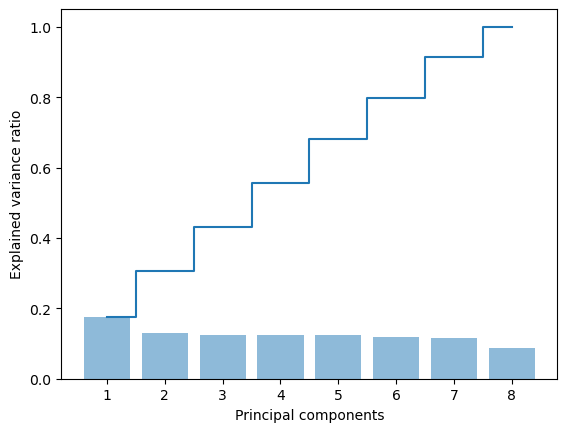

In [40]:
pca = PCA()
X_train_pca = pca.fit_transform(X_train_std)
pca.explained_variance_ratio_
display(pca.explained_variance_ratio_)
plt.bar(range(1, 9), pca.explained_variance_ratio_, alpha=0.5, align='center')
plt.step(range(1, 9), np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')

plt.show()

**Because the principal components of PCA are similar, we won't use PCA to do  dimension reduction**

---
**Choose the accuracy measures:**

* In this section, we use logistic regression as the base classifier to see how class balancing improve the classifier performance
* Because of class-imbalanced, we need to use f1-score or ROC-AUC curve to evaluate our classifier performance
* We use balanced accuracy rate, adjusted f1 score(set class 0 as positive label) and ROC-AUC curve to show that balanced trainingset can 
 generate a better-performance model

---

In [41]:
pipe_lr = make_pipeline(StandardScaler(),
                        LogisticRegression(C=0.01,random_state=1, solver='lbfgs'))
acc_unbalanced = cross_val_score(estimator=pipe_lr,
                                 X=X_train_unbalanced,
                                 y=y_train_unbalanced,
                                 cv=5,
                                 scoring='accuracy',
                                 n_jobs=-1)
print('CV accuracy scores on unbalanced training datasets: %s' % acc_unbalanced)
print('CV accuracy scores on unbalanced training datasets: %.3f +/- %.3f' % (np.mean(acc_unbalanced), np.std(acc_unbalanced)))

CV accuracy scores on unbalanced training datasets: [0.97731035 0.97734208 0.97730962 0.97734208 0.97727715]
CV accuracy scores on unbalanced training datasets: 0.977 +/- 0.000


In [45]:
acc_balanced = cross_val_score(estimator=pipe_lr,
                               X=X_train,
                               y=y_train,
                               cv=5,
                               scoring='accuracy',
                               n_jobs=-1)
print('CV accuracy scores on balanced training datasets: %s' % acc_balanced)
print('CV accuracy scores on balanced training datasets: %.3f +/- %.3f' % (np.mean(acc_balanced), np.std(acc_balanced)))

CV accuracy scores on balanced training datasets: [0.6930384  0.69481533 0.69245715 0.69348169 0.69147222]
CV accuracy scores on balanced training datasets: 0.693 +/- 0.001


**While unbalanced accuracy rate is higher than balanced accuracy rate. It is an illusion. Unbalanced model can predict all sample as class 1. However, in this case, we concentrate more on class 0. So we show the balanced accuracy rate of two models.**

In [46]:
blacc_unbalanced = cross_val_score(estimator=pipe_lr,
                                     X=X_train_unbalanced,
                                     y=y_train_unbalanced,
                                     cv=5,
                                     scoring='balanced_accuracy',
                                     n_jobs=-1)
print('CV balanced accuracy scores on unbalanced training datasets: %s' % blacc_unbalanced)
print('CV balanced accuracy scores on unbalanced training datasets: %.3f +/- %.3f' % (np.mean(blacc_unbalanced), np.std(blacc_unbalanced)))

CV balanced accuracy scores on unbalanced training datasets: [0.5        0.5        0.49998339 0.5        0.49998339]
CV balanced accuracy scores on unbalanced training datasets: 0.500 +/- 0.000


**The balanced accuracy rate of unbalanced model is almost 50%, that means unbalanced model predict all sample as majority class.**

In [47]:
blacc_balanced = cross_val_score(estimator=pipe_lr,
                                 X=X_train,
                                 y=y_train,
                                 cv=5,
                                 scoring='balanced_accuracy',
                                 n_jobs=-1)
print('CV balanced accuracy scores on balanced training datasets: %s' % blacc_balanced)
print('CV balanced accuracy scores on balanced training datasets: %.3f +/- %.3f' % (np.mean(blacc_balanced), np.std(blacc_balanced)))

CV balanced accuracy scores on balanced training datasets: [0.6930384  0.69481533 0.69245715 0.69348529 0.69146862]
CV balanced accuracy scores on balanced training datasets: 0.693 +/- 0.001


**Then we use the confusion matrix to see the precision, recall and f1 score of unbalanced model. It should be noted that we set class 0 as positive label because we concentrate more on minority class**

In [48]:
pipe_lr.fit(X_train_unbalanced, y_train_unbalanced)
y_pred = pipe_lr.predict(X_test)
confmat = confusion_matrix(y_true=y_test, y_pred=y_pred)
print(confmat)
print('Precision: %.3f' % precision_score(y_true=y_test, y_pred=y_pred,pos_label=0))
print('Recall: %.3f' % recall_score(y_true=y_test, y_pred=y_pred,pos_label=0))
print('F1: %.3f' % f1_score(y_true=y_test, y_pred=y_pred,pos_label = 0))

[[    0  1493]
 [    0 58216]]
Precision: 0.000
Recall: 0.000
F1: 0.000


D:\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



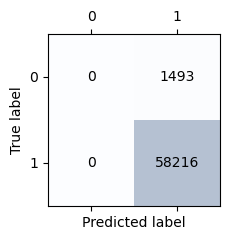

In [49]:
fig, ax = plt.subplots(figsize=(2.5, 2.5))
ax.matshow(confmat, cmap=plt.cm.Blues, alpha=0.3)
for i in range(confmat.shape[0]):
    for j in range(confmat.shape[1]):
        ax.text(x=j, y=i, s=confmat[i, j], va='center', ha='center')

plt.xlabel('Predicted label')
plt.ylabel('True label')

plt.tight_layout()
#plt.savefig('images/06_09.png', dpi=300)
plt.show()

**The confusion matrix of balanced model**

In [50]:
pipe_lr.fit(X_train, y_train)
y_pred = pipe_lr.predict(X_test)
confmat = confusion_matrix(y_true=y_test, y_pred=y_pred)
print(confmat)
print('Precision: %.3f' % precision_score(y_true=y_test, y_pred=y_pred,pos_label=0))
print('Recall: %.3f' % recall_score(y_true=y_test, y_pred=y_pred,pos_label=0))
print('F1: %.3f' % f1_score(y_true=y_test, y_pred=y_pred,pos_label = 0))

[[  301  1192]
 [ 2114 56102]]
Precision: 0.125
Recall: 0.202
F1: 0.154


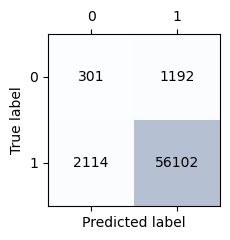

In [51]:
fig, ax = plt.subplots(figsize=(2.5, 2.5))
ax.matshow(confmat, cmap=plt.cm.Blues, alpha=0.3)
for i in range(confmat.shape[0]):
    for j in range(confmat.shape[1]):
        ax.text(x=j, y=i, s=confmat[i, j], va='center', ha='center')

plt.xlabel('Predicted label')
plt.ylabel('True label')

plt.tight_layout()
#plt.savefig('images/06_09.png', dpi=300)
plt.show()

**We draw the ROC-AUC cuve to show the performance of two models**

<Figure size 640x480 with 0 Axes>

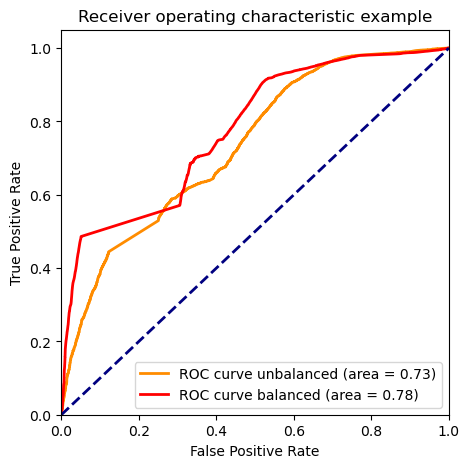

In [52]:
y_score_unbalanced = pipe_lr.fit(X_train_unbalanced, y_train_unbalanced).decision_function(X_train_unbalanced)
y_score_balanced = pipe_lr.fit(X_train, y_train).decision_function(X_train)
fpr_1,tpr_1,threshold = roc_curve(y_train_unbalanced, y_score_unbalanced)
fpr_2,tpr_2,threshold = roc_curve(y_train, y_score_balanced)
roc_auc_1 = auc(fpr_1,tpr_1)
roc_auc_2 = auc(fpr_2,tpr_2)
plt.figure()
lw = 2
plt.figure(figsize=(5,5))
plt.plot(fpr_1, tpr_1, color='darkorange',
         lw=lw, label='ROC curve unbalanced (area = %0.2f)' % roc_auc_1) 
plt.plot(fpr_2, tpr_2, color='red',
         lw=lw, label='ROC curve balanced (area = %0.2f)' % roc_auc_2) 
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

**The result shows that balanced model performance well,and we finally choose balanced accuracy rate, adjusted f1 score and ROC-AUC curve to evaluate our classifier**

In [53]:
f1_score_adj = make_scorer(f1_score, pos_label=0)
my_score = {'bl_accuracy': 'balanced_accuracy',
            'f1_score': f1_score_adj,
             'AUC':'roc_auc'}

---
**Train and tset model:**

* In this section, we try logistic regression, decision tree, random forest and knn to train the model
* Firstly, we use cross validation to see the performance of classifiers
* Secondly, we use grid search to find the best estimator and best hyperparameter.
* Finally, we construct a majority vote classifier to combine our well-performed model and try to improve performance

---

In [54]:
pipe_lr = make_pipeline(StandardScaler(),
                        LogisticRegression(C=0.01,random_state=1, solver='lbfgs'))
pipe_tree = make_pipeline(StandardScaler(),
                         DecisionTreeClassifier(criterion='gini', max_depth=None, random_state=1))
pipe_rf = make_pipeline(StandardScaler(),
                         RandomForestClassifier(criterion='gini', max_depth=None, n_estimators=100, max_features=7, random_state=1))
pipe_knn = make_pipeline(StandardScaler(),
                         KNeighborsClassifier(n_neighbors=5, p=2, metric='minkowski'))

In [55]:
lr_scores = cross_validate(estimator=pipe_lr,
                         X=X_train,
                         y=y_train,
                         cv=10,
                         scoring=my_score,
                         n_jobs=-1)
print('logistic regression balanced accuracy: %.3f +/- %.3f' % (np.mean(lr_scores['test_bl_accuracy']), np.std(lr_scores['test_bl_accuracy'])))
print('logistic regression f1 score: %.3f +/- %.3f' % (np.mean(lr_scores['test_f1_score']), np.std(lr_scores['test_f1_score'])))
print('logistic regression roc_auc score: %.3f +/- %.3f' % (np.mean(lr_scores['test_AUC']), np.std(lr_scores['test_AUC'])))
cv_lr = pd.DataFrame()
cv_lr['algorithm']=['Logistic regression']
cv_lr['balanced accuracy']=[np.mean(lr_scores['test_bl_accuracy'])]
cv_lr['f1 score']=[np.mean(lr_scores['test_f1_score'])]
cv_lr['ROC-AUC score']=[np.mean(lr_scores['test_AUC'])]                        

logistic regression balanced accuracy: 0.693 +/- 0.002
logistic regression f1 score: 0.608 +/- 0.003
logistic regression roc_auc score: 0.776 +/- 0.002


In [56]:
tree_scores = cross_validate(estimator=pipe_tree,
                         X=X_train,
                         y=y_train,
                         cv=10,
                         scoring=my_score,
                         n_jobs=-1)
print('Decision tree balanced accuracy: %.3f +/- %.3f' % (np.mean(tree_scores['test_bl_accuracy']), np.std(tree_scores['test_bl_accuracy'])))
print('Decision tree f1 score: %.3f +/- %.3f' % (np.mean(tree_scores['test_f1_score']), np.std(tree_scores['test_f1_score'])))
print('Decision tree roc_auc score: %.3f +/- %.3f' % (np.mean(tree_scores['test_AUC']), np.std(tree_scores['test_AUC'])))
cv_tree = pd.DataFrame()
cv_tree['algorithm']=['Decision tree']
cv_tree['balanced accuracy']=[np.mean(tree_scores['test_bl_accuracy'])]
cv_tree['f1 score']=[np.mean(tree_scores['test_f1_score'])]
cv_tree['ROC-AUC score']=[np.mean(tree_scores['test_AUC'])]   

Decision tree balanced accuracy: 0.915 +/- 0.001
Decision tree f1 score: 0.919 +/- 0.001
Decision tree roc_auc score: 0.941 +/- 0.001


In [57]:
rf_scores = cross_validate(estimator=pipe_rf,
                         X=X_train,
                         y=y_train,
                         cv=10,
                         scoring=my_score,
                         n_jobs=-1)
print('Random forest balanced accuracy: %.3f +/- %.3f' % (np.mean(rf_scores['test_bl_accuracy']), np.std(rf_scores['test_bl_accuracy'])))
print('Random forest f1 score: %.3f +/- %.3f' % (np.mean(rf_scores['test_f1_score']), np.std(rf_scores['test_f1_score'])))
print('Random forest roc_auc score: %.3f +/- %.3f' % (np.mean(rf_scores['test_AUC']), np.std(rf_scores['test_AUC'])))
cv_rf = pd.DataFrame()
cv_rf['algorithm']=['Random forest']
cv_rf['balanced accuracy']=[np.mean(rf_scores['test_bl_accuracy'])]
cv_rf['f1 score']=[np.mean(rf_scores['test_f1_score'])]
cv_rf['ROC-AUC score']=[np.mean(rf_scores['test_AUC'])] 

Random forest balanced accuracy: 0.924 +/- 0.001
Random forest f1 score: 0.927 +/- 0.001
Random forest roc_auc score: 0.968 +/- 0.001


In [58]:
knn_scores = cross_validate(estimator=pipe_knn,
                         X=X_train,
                         y=y_train,
                         cv=10,
                         scoring=my_score,
                         n_jobs=-1)
print('KNN balanced accuracy: %.3f +/- %.3f' % (np.mean(knn_scores['test_bl_accuracy']), np.std(knn_scores['test_bl_accuracy'])))
print('KNN f1 score: %.3f +/- %.3f' % (np.mean(knn_scores['test_f1_score']), np.std(knn_scores['test_f1_score'])))
print('KNN roc_auc score: %.3f +/- %.3f' % (np.mean(knn_scores['test_AUC']), np.std(knn_scores['test_AUC'])))
cv_knn = pd.DataFrame()
cv_knn['algorithm']=['K-nearst neighbor']
cv_knn['balanced accuracy']=[np.mean(knn_scores['test_bl_accuracy'])]
cv_knn['f1 score']=[np.mean(knn_scores['test_f1_score'])]
cv_knn['ROC-AUC score']=[np.mean(knn_scores['test_AUC'])] 

KNN balanced accuracy: 0.869 +/- 0.003
KNN f1 score: 0.873 +/- 0.004
KNN roc_auc score: 0.924 +/- 0.006


**The results of cross validation as below**

In [59]:
cv_result = pd.concat([cv_lr,cv_tree,cv_rf,cv_knn],axis=0)
cv_result.set_index('algorithm', inplace=True)
display(cv_result)

,balanced accuracy,f1 score,ROC-AUC score
algorithm,,,
Logistic regression,0.693066,0.607915,0.776278
Decision tree,0.914740,0.918850,0.941344
Random forest,0.923973,0.927377,0.967638
K-nearst neighbor,0.868675,0.873245,0.924408


**Use grid search method to find the best classifier and best hyperparameter**

In [78]:
lr = LogisticRegression()
param_grid_lr = [{'solver':['lbfgs'],
                  'C':[0.01, 0.1, 1.0, 10.0, 100.0]}]
lr_gs = GridSearchCV(estimator = lr,
                     param_grid=param_grid_lr,
                     scoring=my_score,
                     refit = 'AUC',
                     cv=10,
                     n_jobs = -1)
lr_gs = lr_gs.fit(X_train_std, y_train)
from pprint import pprint
print(lr_gs.best_score_)
print(lr_gs.best_index_)
print(lr_gs.best_params_)

lr_clf = lr_gs.best_estimator_
print('Test accuracy: %.3f' % lr_clf.score(X_test_std, y_test))

grid_lr = pd.DataFrame()
grid_lr['algorithm']=['Logistic regression']
grid_lr['Balanced accuracy']=[lr_gs.cv_results_['mean_test_bl_accuracy'][lr_gs.best_index_]]
grid_lr['F1 score']=[lr_gs.cv_results_['mean_test_f1_score'][lr_gs.best_index_]]
grid_lr['ROC-AUC score']=[lr_gs.cv_results_['mean_test_AUC'][lr_gs.best_index_]] 
grid_lr['Test accuracy']=[lr_clf.score(X_test_std, y_test)] 

0.7775994342363479
1
{'C': 0.1, 'solver': 'lbfgs'}
Test accuracy: 0.958


In [79]:
tree = DecisionTreeClassifier()
param_grid_tree = [{'criterion':['gini'],
                    'splitter':['best'],
                    'max_depth':[1,2,3,4,5,6,7,None]}]
tree_gs = GridSearchCV(estimator = tree,
                     param_grid=param_grid_tree,
                     scoring=my_score,
                     refit = 'AUC',
                     cv=10,
                     n_jobs = -1)

tree_gs = tree_gs.fit(X_train_std, y_train)
print(tree_gs.best_score_)
print(tree_gs.best_index_)
print(tree_gs.best_params_)

tree_clf = tree_gs.best_estimator_
print('Test accuracy: %.3f' % tree_clf.score(X_test_std, y_test))

grid_tree = pd.DataFrame()
grid_tree['algorithm']=['Decision tree']
grid_tree['Balanced accuracy']=[tree_gs.cv_results_['mean_test_bl_accuracy'][tree_gs.best_index_]]
grid_tree['F1 score']=[tree_gs.cv_results_['mean_test_f1_score'][tree_gs.best_index_]]
grid_tree['ROC-AUC score']=[tree_gs.cv_results_['mean_test_AUC'][tree_gs.best_index_]] 
grid_tree['Test accuracy']=[tree_clf.score(X_test_std, y_test)]

0.9413846246696222
7
{'criterion': 'gini', 'max_depth': None, 'splitter': 'best'}
Test accuracy: 0.949


In [80]:
rf = RandomForestClassifier()
param_grid_rf = [{'criterion':['gini'],
                 'max_depth':[3,5,10,None],
                 'n_estimators':[10,100,200],
                 'max_features':[3,5,7]}]
rf_gs = GridSearchCV(estimator = rf,
                     param_grid=param_grid_rf,
                     scoring=my_score,
                     refit = 'AUC',
                     cv=10,
                     n_jobs = -1)

rf_gs = rf_gs.fit(X_train_std, y_train)
print(rf_gs.best_score_)
print(rf_gs.best_index_)
print(rf_gs.best_params_)

rf_clf = rf_gs.best_estimator_
print('Test accuracy: %.3f' % rf_clf.score(X_test_std, y_test))

grid_rf = pd.DataFrame()
grid_rf['algorithm']=['Random forest']
grid_rf['Balanced accuracy']=[rf_gs.cv_results_['mean_test_bl_accuracy'][rf_gs.best_index_]]
grid_rf['F1 score']=[rf_gs.cv_results_['mean_test_f1_score'][rf_gs.best_index_]]
grid_rf['ROC-AUC score']=[rf_gs.cv_results_['mean_test_AUC'][rf_gs.best_index_]] 
grid_rf['Test accuracy']=[rf_clf.score(X_test_std, y_test)] 

0.9679567757668364
35
{'criterion': 'gini', 'max_depth': None, 'max_features': 7, 'n_estimators': 200}
Test accuracy: 0.962


In [85]:
knn = KNeighborsClassifier(weights='distance',p=1, metric='minkowski')
param_grid_knn = [{'n_neighbors':[2,3,4,5,10]}]
knn_gs = GridSearchCV(estimator = knn,
                     param_grid=param_grid_knn,
                     scoring=my_score,
                     refit = 'AUC',
                     cv=10,
                     n_jobs = -1)

knn_gs = knn_gs.fit(X_train_std, y_train)
print(knn_gs.best_score_)
print(knn_gs.best_index_)
print(knn_gs.best_params_)

knn_clf = knn_gs.best_estimator_
print('Test accuracy: %.3f' % knn_clf.score(X_test_std, y_test))

grid_knn = pd.DataFrame()
grid_knn['algorithm']=['K-nearst neighbor']
grid_knn['Balanced accuracy']=[knn_gs.cv_results_['mean_test_bl_accuracy'][knn_gs.best_index_]]
grid_knn['F1 score']=[knn_gs.cv_results_['mean_test_f1_score'][knn_gs.best_index_]]
grid_knn['ROC-AUC score']=[knn_gs.cv_results_['mean_test_AUC'][knn_gs.best_index_]] 
grid_knn['Test accuracy']=[knn_clf.score(X_test_std, y_test)] 

0.9384219002306509
4
{'n_neighbors': 10}
Test accuracy: 0.300


**Combining classifiers via majority vote**

In [82]:
from sklearn.base import BaseEstimator
from sklearn.base import ClassifierMixin
from sklearn.preprocessing import LabelEncoder
from sklearn.base import clone
from sklearn.pipeline import _name_estimators
import numpy as np
import operator


class MajorityVoteClassifier(BaseEstimator, 
                             ClassifierMixin):
    """ A majority vote ensemble classifier

    Parameters
    ----------
    classifiers : array-like, shape = [n_classifiers]
      Different classifiers for the ensemble

    vote : str, {'classlabel', 'probability'} (default='classlabel')
      If 'classlabel' the prediction is based on the argmax of
        class labels. Else if 'probability', the argmax of
        the sum of probabilities is used to predict the class label
        (recommended for calibrated classifiers).

    weights : array-like, shape = [n_classifiers], optional (default=None)
      If a list of `int` or `float` values are provided, the classifiers
      are weighted by importance; Uses uniform weights if `weights=None`.

    """
    def __init__(self, classifiers, vote='classlabel', weights=None):

        self.classifiers = classifiers
        self.named_classifiers = {key: value for key, value
                                  in _name_estimators(classifiers)}
        self.vote = vote
        self.weights = weights

    def fit(self, X, y):
        """ Fit classifiers.

        Parameters
        ----------
        X : {array-like, sparse matrix}, shape = [n_examples, n_features]
            Matrix of training examples.

        y : array-like, shape = [n_examples]
            Vector of target class labels.

        Returns
        -------
        self : object

        """
        if self.vote not in ('probability', 'classlabel'):
            raise ValueError("vote must be 'probability' or 'classlabel'"
                             "; got (vote=%r)"
                             % self.vote)

        if self.weights and len(self.weights) != len(self.classifiers):
            raise ValueError('Number of classifiers and weights must be equal'
                             '; got %d weights, %d classifiers'
                             % (len(self.weights), len(self.classifiers)))

        # Use LabelEncoder to ensure class labels start with 0, which
        # is important for np.argmax call in self.predict
        self.lablenc_ = LabelEncoder()
        self.lablenc_.fit(y)
        self.classes_ = self.lablenc_.classes_
        self.classifiers_ = []
        for clf in self.classifiers:
            fitted_clf = clone(clf).fit(X, self.lablenc_.transform(y))
            self.classifiers_.append(fitted_clf)
        return self

    def predict(self, X):
        """ Predict class labels for X.

        Parameters
        ----------
        X : {array-like, sparse matrix}, shape = [n_examples, n_features]
            Matrix of training examples.

        Returns
        ----------
        maj_vote : array-like, shape = [n_examples]
            Predicted class labels.
            
        """
        if self.vote == 'probability':
            maj_vote = np.argmax(self.predict_proba(X), axis=1)
        else:  # 'classlabel' vote

            #  Collect results from clf.predict calls
            predictions = np.asarray([clf.predict(X)
                                      for clf in self.classifiers_]).T

            maj_vote = np.apply_along_axis(
                                      lambda x:
                                      np.argmax(np.bincount(x,
                                                weights=self.weights)),
                                      axis=1,
                                      arr=predictions)
        maj_vote = self.lablenc_.inverse_transform(maj_vote)
        return maj_vote

    def predict_proba(self, X):
        """ Predict class probabilities for X.

        Parameters
        ----------
        X : {array-like, sparse matrix}, shape = [n_examples, n_features]
            Training vectors, where n_examples is the number of examples and
            n_features is the number of features.

        Returns
        ----------
        avg_proba : array-like, shape = [n_examples, n_classes]
            Weighted average probability for each class per example.

        """
        probas = np.asarray([clf.predict_proba(X)
                             for clf in self.classifiers_])
        avg_proba = np.average(probas, axis=0, weights=self.weights)
        return avg_proba

    def get_params(self, deep=True):
        """ Get classifier parameter names for GridSearch"""
        if not deep:
            return super(MajorityVoteClassifier, self).get_params(deep=False)
        else:
            out = self.named_classifiers.copy()
            for name, step in self.named_classifiers.items():
                for key, value in step.get_params(deep=True).items():
                    out['%s__%s' % (name, key)] = value
            return out

**Select logistic regression, decision tree and random forest to construct the majority vote classifier**

In [83]:
mv_clf = MajorityVoteClassifier(classifiers=[tree_clf,rf_clf,lr_clf])
#weights = [1,2.1,1]
scores = cross_validate(estimator=mv_clf,
                        X=X_train_std,
                        y=y_train,
                        cv=10,
                        scoring=my_score,
                        n_jobs=-1)
grid_mv = pd.DataFrame()
grid_mv['algorithm']=['Majority voting classifier']
grid_mv['Balanced accuracy']=[np.mean(scores['test_bl_accuracy'])]
grid_mv['F1 score']=[np.mean(scores['test_f1_score'])]
grid_mv['ROC-AUC score']=[np.mean(scores['test_AUC'])] 
mv_clf_model = mv_clf.fit(X_train_std, y_train)
y_predict = mv_clf_model.predict(X_test_std)
Error = y_predict-y_test.values.T
count = np.count_nonzero(Error)
Accuracy_rate = 1-count/len(Error.T)
grid_mv['Test accuracy']=[Accuracy_rate] 

**The final result of all classifiers as below:**

In [86]:
grid_result = pd.concat([grid_lr,grid_tree,grid_rf,grid_knn,grid_mv],axis=0)
grid_result.set_index('algorithm', inplace=True)
display(grid_result)

,Balanced accuracy,F1 score,ROC-AUC score,Test accuracy
algorithm,,,,
Logistic regression,0.693183,0.609246,0.777599,0.958448
Decision tree,0.914806,0.918912,0.941385,0.949271
Random forest,0.924076,0.927475,0.967957,0.962033
K-nearst neighbor,0.882237,0.886311,0.938422,0.300055
Majority voting classifier,0.920356,0.923956,0.963612,0.963691


---
**Analysis and conclusion:**

* Random forest classifier has the best accuracy measures, which means that random forest model has the strongest generalization ability
* The performance of decision tree is similar to random forest, suggests that tree model can solve this problem well.
* Logistic regression has the lower perfomance than KNN, while it has higher test accuarcy than KNN.
* Even if KNN has a good accuracy measures set, its test accuracy is lower than 50%, which means that knn model failed to classify on the testset.
* The possible reason of difference between KNN and logistic regression is that imputing the missing value with median value resulting in a large number of samples clumped together in tensor space and indistinguishable. 
* Finally, we bulid a majority voting classifier, generalization ability decreases while test accuracy increases.